In [1]:
import numpy as np
import sys, os
import requests
import Dans_Diffraction
import plotly

from libs import absorption_plots
from libs import draw_crystal_structures
from libs import three_d_draw

# Get cif file

In [2]:
if not os.path.exists('cif_files'):
    os.makedirs('cif_files')
url = 'http://www.crystallography.net/cod/1533978.cif'
cif_file = 'cif_files/'+url.split('/')[-1]
if not os.path.isfile(cif_file):
    r = requests.get(url)
    open(cif_file , 'wb').write(r.content)

# Plot absorbance

Scattering Options:
                            Type : xray
                  Default Energy : 17.000 keV
                    Powder Units : tth
  Specular Direction (reflection): ( 0, 0, 1)
Parallel Direction (transmission): ( 0, 0, 1)
                   Sample Offset :  0.00
             Minimum Theta angle : -180.00
             Maximum Theta angle : 180.00
         Minimum Two-Theta angle : -180.00
         Maximum Two-Theta angle : 180.00
['Mn', 'O$_3$', 'Y']
Density: 5.102 gm/cm³
a =  6.148 Å,  b =  6.148 Å,  c = 11.443 Å
𝛼 =    90.00,  𝛽 =    90.00,  𝛾 =   120.00


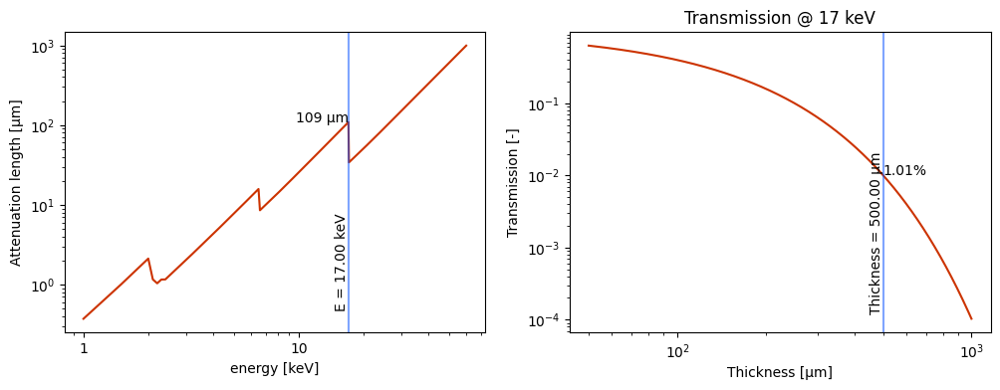

In [4]:
energy_kev = 17
xtl = Dans_Diffraction.Crystal(cif_file)
xtl.generate_lattice()
xtl.Scatter.setup_scatter(type='xray', energy_kev=energy_kev)
xtl.Scatter._scattering_max_twotheta = 45

print(xtl.cif['_chemical_formula_sum'].replace('2','$_2$').replace('3','$_3$').split(' '))
print(f'Density: {xtl.Properties.density():.3f} gm/cm³')
cell_par = str(xtl.Cell)
cell_par = cell_par.replace('\n','').replace('\r','')
cell_par = cell_par.split('A = ')
print(cell_par[0].replace('A','Å'))
print('𝛼 = '+cell_par[1].split('Volume')[0].replace('A','𝛼').replace('B','𝛽').replace('G','𝛾'))

sample_thickness = 500 #µm
fig2d = absorption_plots.get_att_plot(xtl, energy_kev, sample_thickness)
#st.write(fig2d)


# Plot reflections

In [5]:
xtl.Scatter._scattering_max_twotheta = 30
print(xtl.Scatter.print_all_reflections())

Energy = 17.000 keV
Radiation: xray
( h, k, l)      TwoTheta  Intensity
(  0,  0, -2)       7.31    5268.63
(  0,  0,  2)       7.31    5268.63
(  1,  0,  0)       7.85       1.04
(  1,  0,  2)      10.74    1202.94
(  1,  0, -2)      10.74    1202.94
(  2, -1,  0)      13.63   17971.47
(  2, -1, -1)      14.11   18619.21
(  2, -1,  1)      14.11   18619.21
(  0,  0,  4)      14.65   76381.95
(  0,  0, -4)      14.65   76381.95
(  2, -1,  2)      15.48   36708.97
(  2, -1, -2)      15.48   36708.97
(  1,  0,  4)      16.64    1992.50
(  1,  0, -4)      16.64    1992.50
(  2,  0,  2)      17.38    2214.32
(  2,  0, -2)      17.38    2214.32
(  2, -1, -3)      17.53    1752.95
(  2, -1,  3)      17.53    1752.95
(  2, -1,  4)      20.06   20876.85
(  2, -1, -4)      20.06   20876.85
(  3, -1,  0)      20.88       7.71
(  3, -1,  1)      21.20     134.95
(  3, -1, -1)      21.20     136.46
(  2,  0, -4)      21.57    2932.34
(  2,  0,  4)      21.57    2932.34
(  0,  0, -6)      22.05    

# Visualize crystal strcuture

In [6]:
cage_list = ['Y']
oxygen_cage_radius = 2.5
make_bonds = ['Mn','O']
max_bond_length = 3
min_bond_length = 0
crystal_scale = 600.0
legend_pos_shift = [2,0,-4]
crystal_axes_shift = [-5,-3,-5]
show_text = True


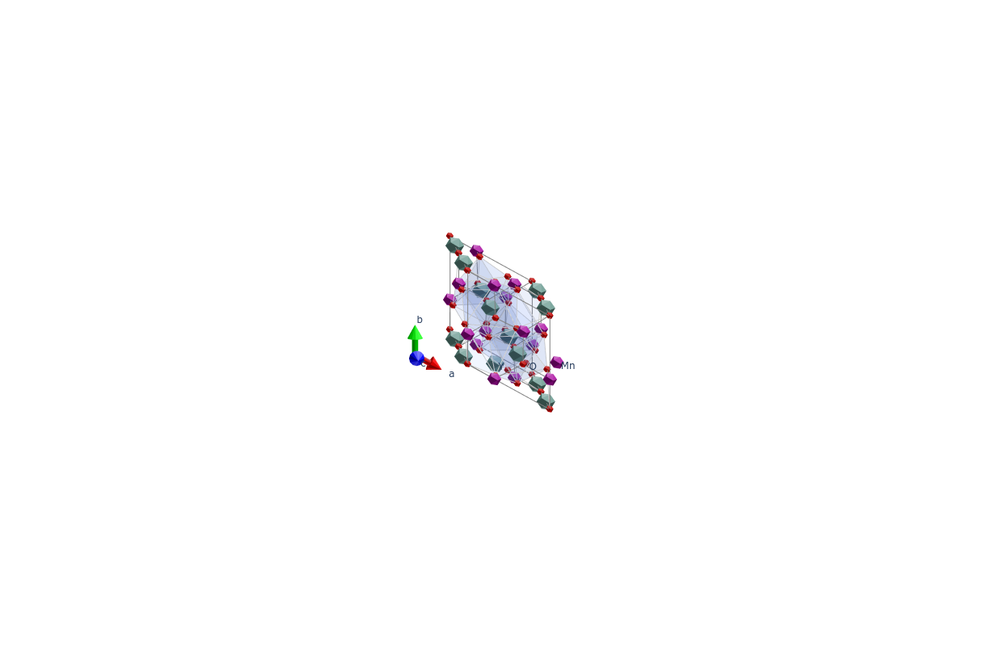

In [7]:
drawing = three_d_draw.Drawing()

crystal_structure = draw_crystal_structures.add_crystal_structure( cif_file, scale = crystal_scale,
            rotation_function = None,
            legend_pos_shift = legend_pos_shift,
            axes_shift = crystal_axes_shift,
            max_bond_length = max_bond_length, min_bond_length = min_bond_length,
            linewidth = 3,
            bounding_box_facecolor = [0.5,0.6,0.7,0],
            cage_line_color = [0.8,0.8,0.8,1],
            linecolor = [0.5,0.5,0.5,1],
            show_text = show_text,
            cage_list = cage_list,
            make_bonds = make_bonds,
            #atom_legend_step = Q/np.sqrt(np.sum(Q**2)),
            )

crystal_structure = drawing.add_atom_list(crystal_structure)
ax = {} # <- this will be populated by plotly objects
ax['data'] = []
ax['annotations'] = []

drawing.draw_structure(ax)

# enable render
fig = plotly.graph_objects.Figure(data=ax['data'])
camera = dict(
    up=dict(x=0, y=1, z=0),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=-0.2, y=0.4, z=2),
    #eye=dict(x=-0, y=0, z=2),
    projection = dict(
    type="orthographic",
    ),
)
scene = dict(
        xaxis = dict(visible=False, range=[-500000,500000]),
        yaxis = dict(visible=False, range=[-500000,500000]),
        zaxis = dict(visible=False, range=[-500000,500000]),
        aspectratio = dict(x=80, y=80, z=80),
        annotations = ax['annotations'],

    )
fig.update_layout( scene_camera = camera, scene = scene,
        margin=dict(t=0, r=0, l=0, b=0),
        height=800,
        width = 1100,
        )

# Visualize DF-XRM

In [8]:
params = {}
params['wavelength_in_um'] = 4.135667696*10**-15 *299792458 / energy_kev /1000*10**6 #7.2932e-5 #7.2932e-11 m = 17 keV
params['shape'] = np.array([1000,500,sample_thickness]) # [sample_height,sample_width,sample_thickness] in µm
params['hkl'] = np.array([0,0,4]) # (h,k,l)
up_dir = np.array([0,0,4]) # sample 'up' in real space xyz, could also use xtl.Cell.calculateQ(..)[0] to convert from (hkl) or xtl.Cell.calculateR(...)[0] to convert from [uvw]
front_dir = np.array([0,1,0]) # sample 'front' in real space xyz,

Q = xtl.Cell.calculateQ( params['hkl'])[0] # Q in real space x,y,z, Å-1


scale = 1.0
extend_beam = [25000.0,25000.0]
extend_scattered_beam = 7500.0
crysta_structure_position = [-7000, -1000, 6000]
lens_scale = 1.0
params['transverse_width'] = 100.0
params['beam_thickness'] = 10.0
magnification = 3.0


In [10]:
# make rotation function



if up_dir[0]>0:
    z_rot = -np.arctan2(up_dir[1],up_dir[0])*180/np.pi
else:
    z_rot = -np.pi/2*np.sign(up_dir[1])*180/np.pi
y_rot = -np.arctan2(up_dir[2],np.sqrt(up_dir[0]**2+up_dir[1]**2))*180/np.pi

z_rot_crystal = z_rot
y_rot_crystal = y_rot
x_rot_crystal = 0

def crystal_rotation_function(hkl):
    '''
    function that describes rotation in cartesian coordinates of crystal structure or reciprocal space
    performes an in-place rotation on a numpy array of length three
    '''
    draw_crystal_structures.rotate_z(hkl, z_rot_crystal*np.pi/180)# 45 degree rotation around the x-axis -> swap b and c
    draw_crystal_structures.rotate_y(hkl, y_rot_crystal*np.pi/180)# 45 degree rotation around the x-axis -> swap b and c
    draw_crystal_structures.rotate_x(hkl, x_rot_crystal*np.pi/180)# 45 degree rotation around the x-axis -> swap b and c
    return hkl

front_dir_r = crystal_rotation_function(np.copy(front_dir))
x_rot = np.arctan2(front_dir_r[1],front_dir_r[2])*180/np.pi
x_rot_crystal = x_rot


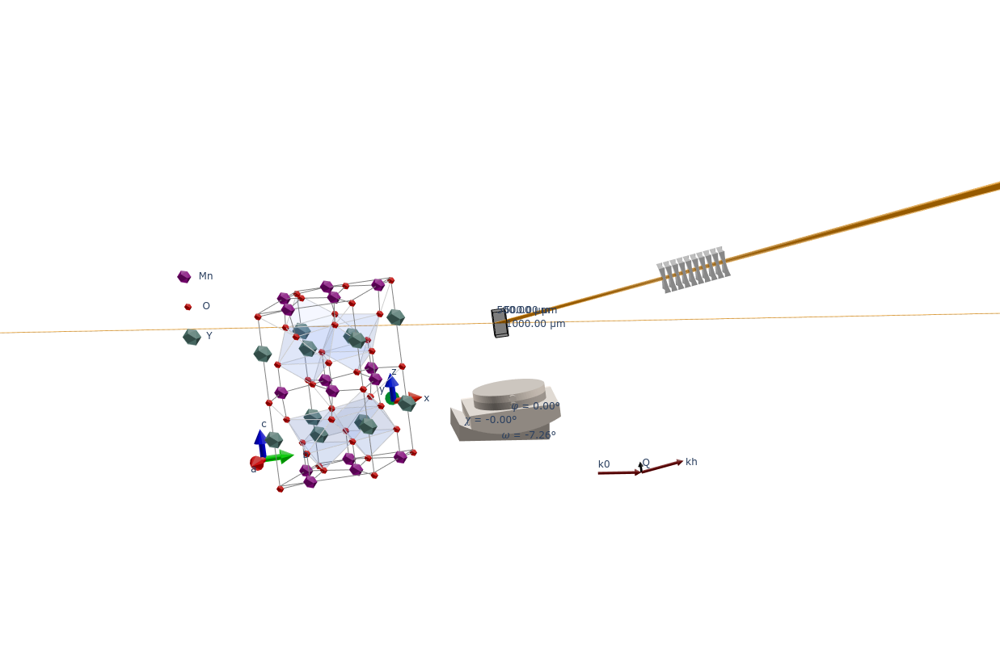

In [11]:
params['Q_vector'] =  crystal_rotation_function(np.copy(Q))*10**4 # in inverse um

beam_exit_dir = crystal_rotation_function(np.copy(front_dir)) # transformation for crystal coordinate system to sample coordinate system
plane_normal = np.cross(params['Q_vector'],beam_exit_dir)
k_dir_orthogonal_to_Q = np.cross(plane_normal,params['Q_vector'])
k_ort_l = np.linalg.norm(k_dir_orthogonal_to_Q)
'''
We have:
    k0 = -0.5*Q + x*k_ort
    so that |k0| = k
    where Q and k_ort are orthogonal, so that
    0.25|Q|**2 + x**2*|k_ort|**2 = |k0|**2
    i.e:
    x = np.sqrt(  ( |k0|**2 - 0.25|Q|**2 ) / ( |k_ort|**2) )
'''
k_abs = 2*np.pi/params['wavelength_in_um']
x = np.sqrt(  ( k_abs**2 - 0.25*Q**2 ) / ( k_ort_l**2) )
params['k0_vector'] = -0.5*params['Q_vector'] + x*k_dir_orthogonal_to_Q
params['kh_vector'] = 0.5*params['Q_vector'] + x*k_dir_orthogonal_to_Q

'''
need to remake the crystal_structure every time as this is modified when visualized
'''
crystal_structure = draw_crystal_structures.add_crystal_structure( cif_file, scale = crystal_scale,
            rotation_function = crystal_rotation_function, # note the crystal rotation function here, but not used above!
            legend_pos_shift = legend_pos_shift,
            axes_shift = crystal_axes_shift,
            max_bond_length = max_bond_length, min_bond_length = min_bond_length,
            linewidth = 3,
            bounding_box_facecolor = [0.5,0.6,0.7,0],
            cage_line_color = [0.8,0.8,0.8,1],
            linecolor = [0.5,0.5,0.5,1],
            show_text = show_text,
            cage_list = cage_list,
            make_bonds = make_bonds,
            #atom_legend_step = Q/np.sqrt(np.sum(Q**2)),
            )

drawing, fig, ax, outstr = three_d_draw.make_3d_perspective(params,
            export_blender_filepath = 'DF_XRM_vis_to_blender.pickled',
            crystal_rotation_function = crystal_rotation_function,
            scale = scale,
            atom_list = crystal_structure,
            crysta_structure_position = crysta_structure_position,
            extend_beam = extend_beam,
            extend_scattered_beam = extend_scattered_beam,
            lens_scale = lens_scale*0.2,
            bounding_box_facecolor = [0,0,0,0.3],
            draw_stage = True,
            draw_axes = True,
            draw_scattering_arrows = True,
            show_text = show_text,
            magnification = magnification,
            )
fig.show()

2022-11-22 16:35:07.581 INFO    matplotlib.mathtext: Substituting symbol 𝜃 from STIXGeneral
2022-11-22 16:35:07.656 INFO    matplotlib.mathtext: Substituting symbol 𝜃 from STIXGeneral


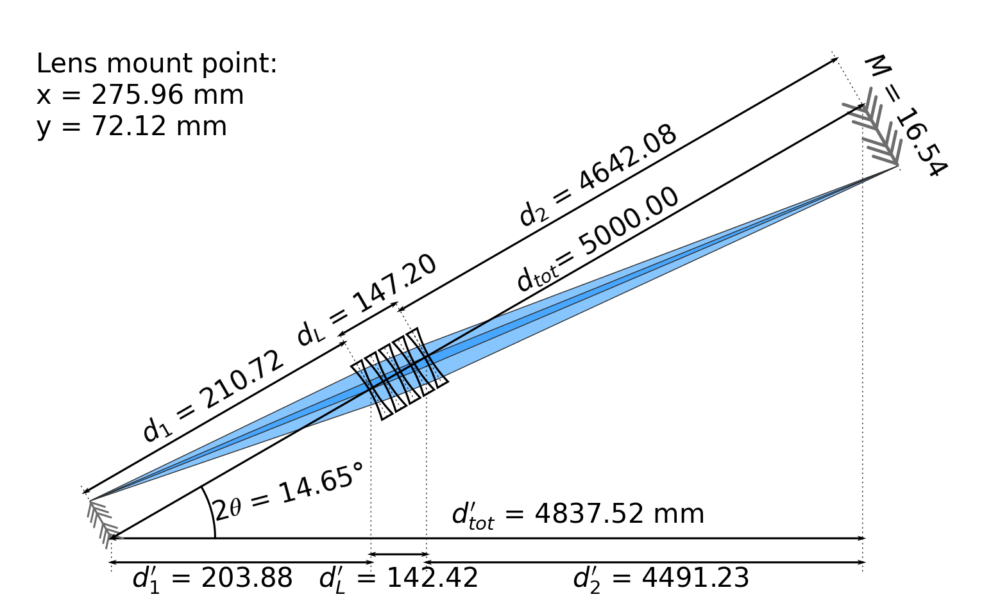

In [21]:
import toml
from libs import optics_geometry
# configure lens
lens_file = "assets/lens_files/id06.lens"
# define geometry for lens
d_tot = 5000 # mm
two_theta = 2*np.arcsin(np.sqrt(np.sum(params['Q_vector']**2))*params['wavelength_in_um']/4/np.pi)*180/np.pi
# plot
parsed_lens_file = toml.load(lens_file)
fig_optics, ax = optics_geometry.make_optics_geometry_plot(\
                energy_kev, two_theta, d_tot, parsed_lens_file)